In [1]:
IMAGE_BASE_DIR = "/kaggle/input/food41/images"
META_BASE_DIR = "/kaggle/input/food41/meta/meta"

# Train and test df

In [2]:
import pandas as pd
import json

# load json for train and test
with open(f"{META_BASE_DIR}/train.json", 'r') as file:
    train_json = json.load(file)
with open(f"{META_BASE_DIR}/test.json", 'r') as file:
    test_json = json.load(file)

In [3]:
len(train_json.keys()), len(test_json.keys())

(101, 101)

In [4]:
list(train_json.keys())[:10]

['churros',
 'hot_and_sour_soup',
 'samosa',
 'sashimi',
 'pork_chop',
 'spring_rolls',
 'panna_cotta',
 'beef_tartare',
 'greek_salad',
 'foie_gras']

There are 101 classes 

In [5]:
# now, let convert those json format to dataframe
def json_to_dataframe(data_json):
    data_rows = []
    for label, image_paths in data_json.items():
        for image_path in image_paths:
            data_rows.append([label, image_path])
    df = pd.DataFrame(data_rows, columns=['label', 'image_path'])
    df['filepath'] = IMAGE_BASE_DIR+'/' + df['image_path'] +'.jpg'
    return df

In [6]:
df_train = json_to_dataframe(train_json)
df_test = json_to_dataframe(test_json)

In [52]:
print("Train len:", len(df_train))
print("Test len:", len(df_test))

Train len: 75750
Test len: 25250


In [7]:
df_train.label.value_counts()

label
churros             750
ravioli             750
hamburger           750
filet_mignon        750
shrimp_and_grits    750
                   ... 
caprese_salad       750
gnocchi             750
chicken_wings       750
bread_pudding       750
oysters             750
Name: count, Length: 101, dtype: int64

In [8]:
df_test.label.value_counts()

label
churros             250
ravioli             250
hamburger           250
filet_mignon        250
shrimp_and_grits    250
                   ... 
caprese_salad       250
gnocchi             250
chicken_wings       250
bread_pudding       250
oysters             250
Name: count, Length: 101, dtype: int64

In [9]:
df_train

,label,image_path,filepath
0,churros,churros/1004234,/kaggle/input/food41/images/churros/1004234.jpg
1,churros,churros/1013460,/kaggle/input/food41/images/churros/1013460.jpg
2,churros,churros/1016791,/kaggle/input/food41/images/churros/1016791.jpg
3,churros,churros/102100,/kaggle/input/food41/images/churros/102100.jpg
4,churros,churros/1025494,/kaggle/input/food41/images/churros/1025494.jpg
...,...,...,...
75745,oysters,oysters/982030,/kaggle/input/food41/images/oysters/982030.jpg
75746,oysters,oysters/98268,/kaggle/input/food41/images/oysters/98268.jpg
75747,oysters,oysters/98313,/kaggle/input/food41/images/oysters/98313.jpg
75748,oysters,oysters/990299,/kaggle/input/food41/images/oysters/990299.jpg


# Random images for each class 

In [10]:
import pandas as pd
import random
import matplotlib.pyplot as plt
from PIL import Image

def display_random_images_from_class(df, class_name, num_images=3, label_column='label', filepath_column='filepath'):
    """
    Randomly displays a specified number of images from a specific class in a DataFrame.

    Args:
        df: The Pandas DataFrame containing the image data.
        class_name: The name of the class to display images from.
        num_images: The number of images to display from the selected class.
        label_column: The name of the column containing the class labels.
        filepath_column: The name of the column containing the file paths of the images.
    """

    # Filter the DataFrame to include only rows from the specified class
    class_df = df[df[label_column] == class_name]

    # Check if the class exists in the DataFrame
    if class_df.empty:
        print(f"Error: Class '{class_name}' not found in the DataFrame.")
        return

    # Get a list of file paths for the selected class
    image_filepaths = class_df[filepath_column].tolist()

    # Randomly select image file paths
    if len(image_filepaths) > num_images:
        selected_images = random.sample(image_filepaths, num_images)
    else:
        selected_images = image_filepaths
        print(f"Warning: Class '{class_name}' has fewer than {num_images} images.")

    # Display the selected images
    plt.figure(figsize=(12, 4))
    for i, image_path in enumerate(selected_images):
        try:
            img = Image.open(image_path)
            plt.subplot(1, num_images, i + 1)
            plt.imshow(img)
            plt.title(f"{class_name}")
            plt.axis('off')
        except Exception as e:
            print(f"Error loading or displaying image: {image_path} - {e}")

    plt.tight_layout()
    plt.show()



## Some strange food (for vietnamese like me)

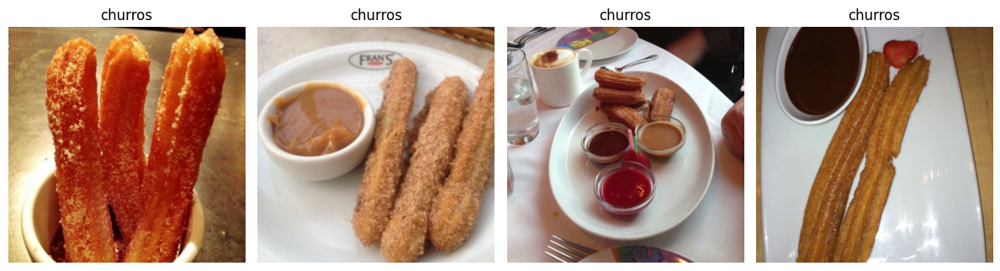

In [11]:
display_random_images_from_class(df_train, 'churros', num_images=4)

Fried dough pastries, often dusted with sugar and served with chocolate sauce. Popular in Spain and Latin America

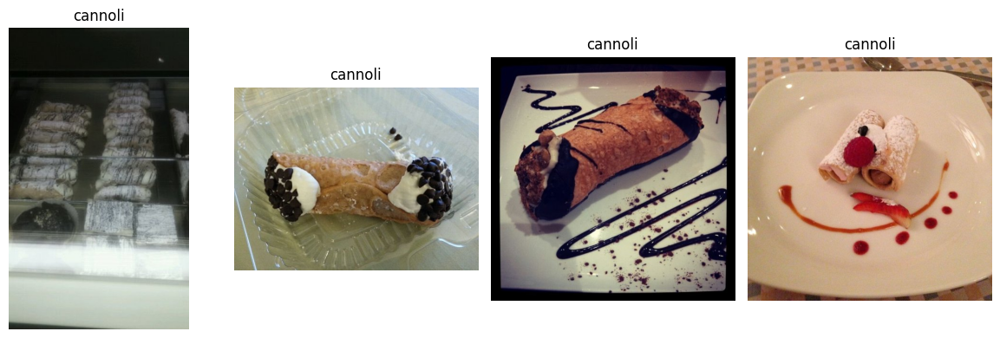

In [12]:
display_random_images_from_class(df_train, 'cannoli', num_images=4)

Italian pastries consisting of fried dough tubes filled with sweet ricotta cheese.

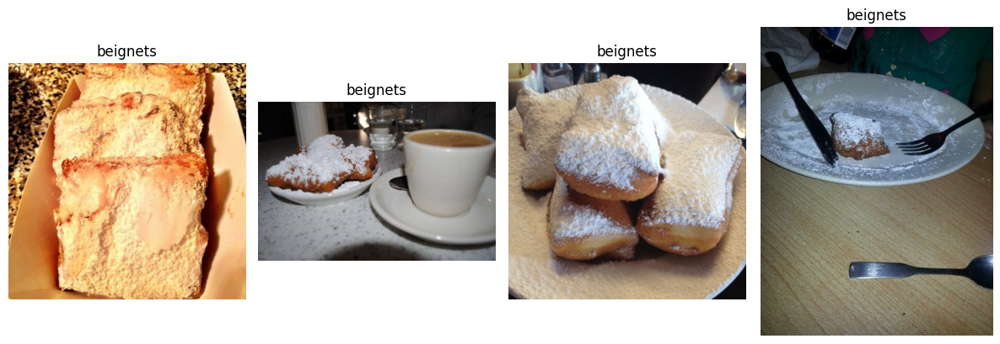

In [13]:
display_random_images_from_class(df_train, 'beignets', num_images=4)

Beignets: Deep-fried dough pastries, a specialty of New Orleans, often dusted with powdered sugar.

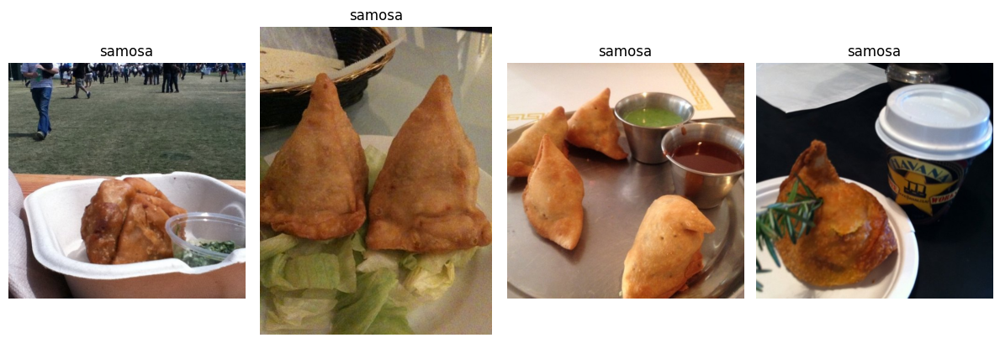

In [14]:
display_random_images_from_class(df_train, 'samosa', num_images=4)

A fried or baked pastry filled with spiced potatoes, peas, and sometimes meat. Popular in South Asia.

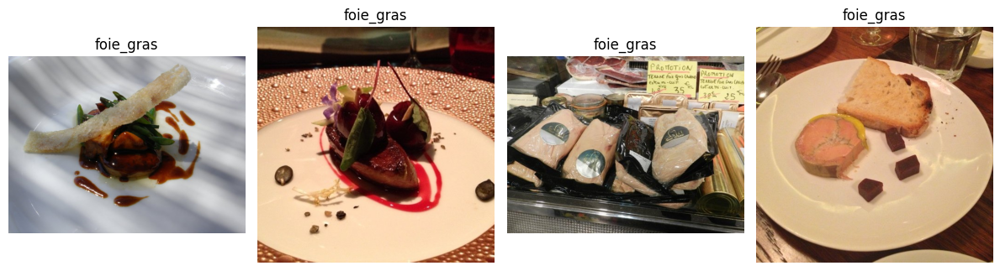

In [15]:
display_random_images_from_class(df_train, 'foie_gras', num_images=4)

A luxury food product made from the liver of a fattened duck or goose.

**NOTE**: this dish is strange, because they can come with many shapes

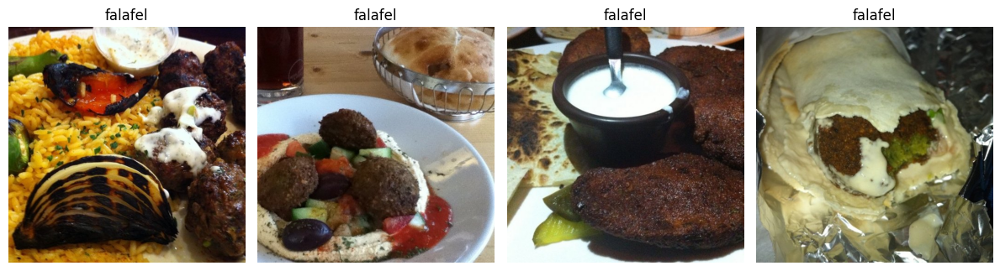

In [16]:
display_random_images_from_class(df_train, 'falafel', num_images=4)

Deep-fried balls made from ground chickpeas or fava beans, popular in Middle Eastern cuisine.

**NOTE**: this dish is also strange, it is wrapped like Taco 

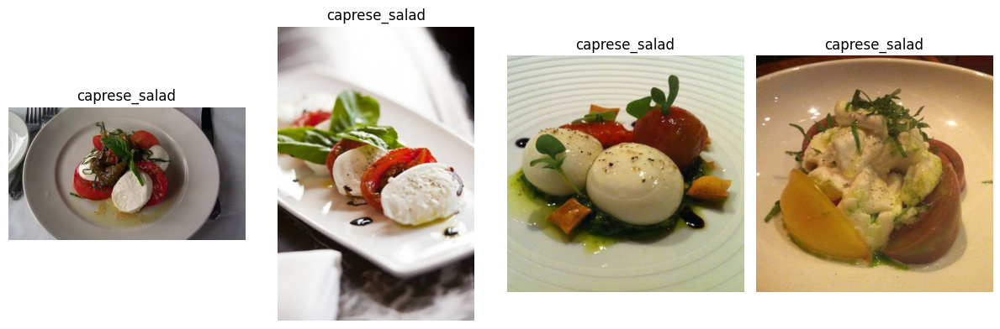

In [17]:
display_random_images_from_class(df_train, 'caprese_salad', num_images=4)

An Italian salad made with tomatoes, mozzarella, basil, and olive oil.

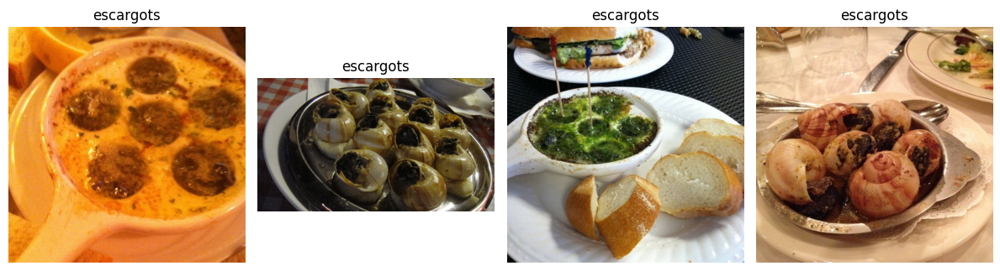

In [18]:
display_random_images_from_class(df_train, 'escargots', num_images=4)

Cooked land snails, often served with garlic butter, a French delicacy.

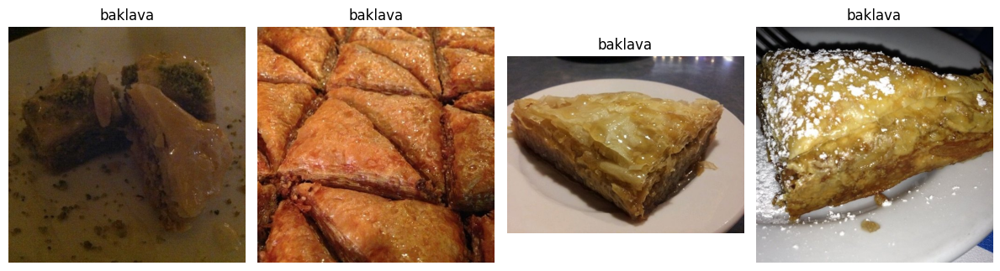

In [19]:
display_random_images_from_class(df_train, 'baklava', num_images=4)

Baklava: A sweet pastry made of layers of phyllo dough, nuts, and honey, popular in Middle Eastern and Mediterranean cuisines.

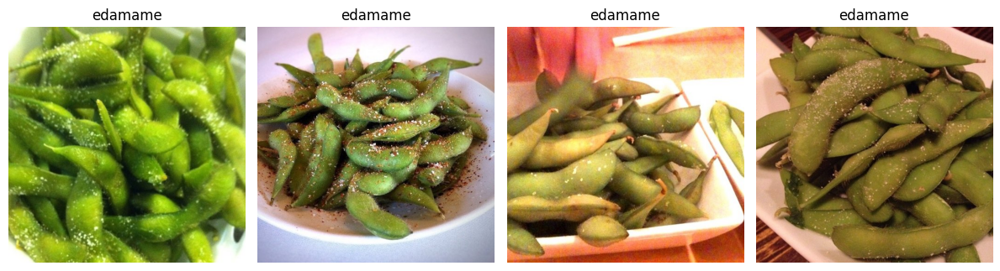

In [20]:
display_random_images_from_class(df_train, 'edamame', num_images=4)

Young soybeans, often steamed and salted, a popular Japanese appetizer.

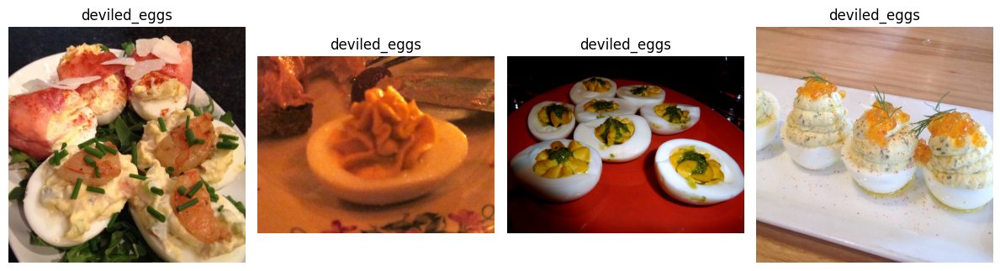

In [21]:
display_random_images_from_class(df_train, 'deviled_eggs', num_images=4)

Hard-boiled eggs filled with a mixture of yolk, mayonnaise, and mustard.

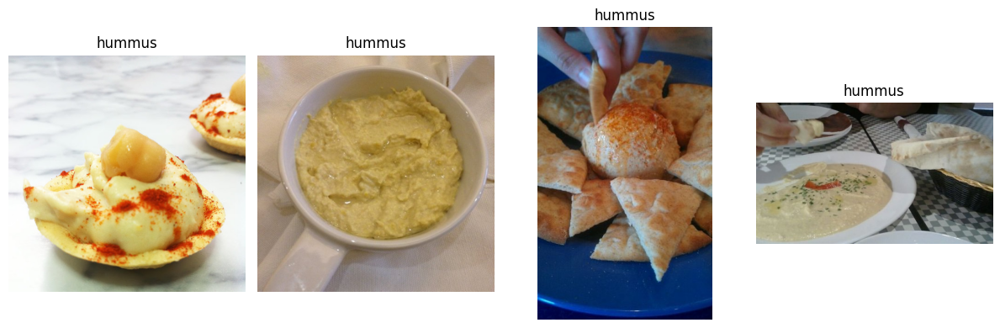

In [22]:
display_random_images_from_class(df_train, 'hummus', num_images=4)

A Middle Eastern dip made from blended chickpeas, tahini, lemon juice, and garlic.

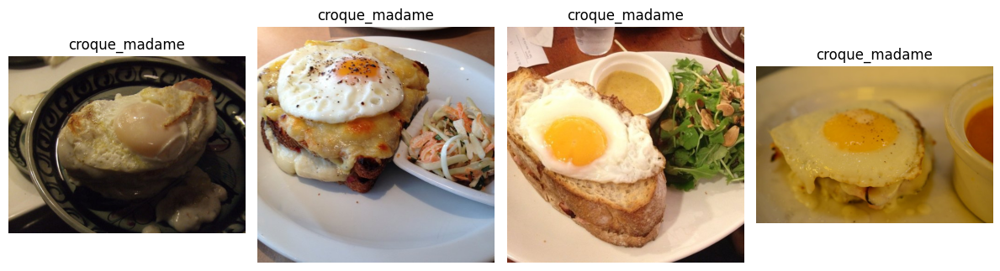

In [23]:
display_random_images_from_class(df_train, 'croque_madame', num_images=4)

A French grilled ham and cheese sandwich topped with a fried egg.



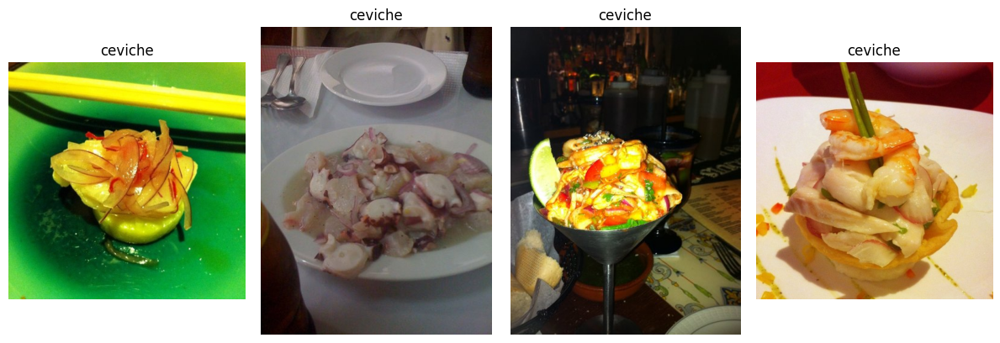

In [24]:
display_random_images_from_class(df_train, 'ceviche', num_images=4)

A dish of raw fish marinated in citrus juice, popular in Latin America.



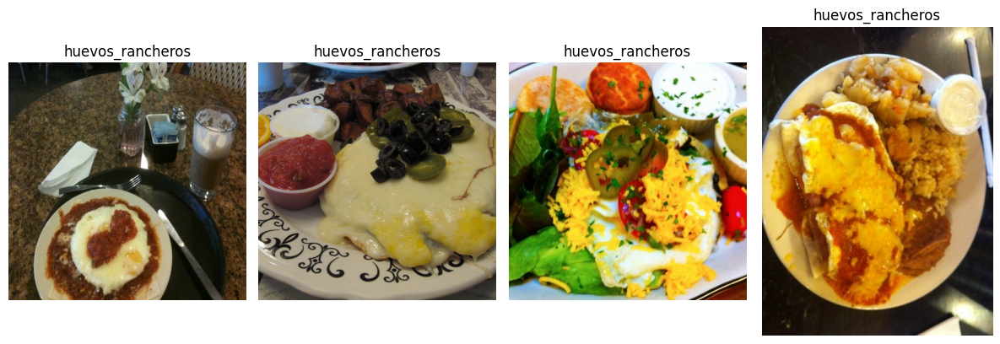

In [25]:
display_random_images_from_class(df_train, 'huevos_rancheros', num_images=4)

A Mexican breakfast dish of fried eggs served on tortillas with salsa and beans.

## Observation

Some dish could be easily to classified by their signature color/properties/features

But some can be really hard to distinguish because they can be server in many shapes/styles.

# Size of images

In [26]:
import pandas as pd
from PIL import Image
from tqdm import tqdm
def add_width_height_columns(df, filepath_column='filepath'):
    """
    Adds 'width' and 'height' columns to a DataFrame based on image dimensions.

    Args:
        df: The Pandas DataFrame containing image file paths.
        filepath_column: The name of the column containing the file paths.

    Returns:
        A new DataFrame with 'width' and 'height' columns added.
    """

    widths = []
    heights = []

    for filepath in tqdm(df[filepath_column]):
        try:
            with Image.open(filepath) as img:
                width, height = img.size
                widths.append(width)
                heights.append(height)
        except Exception as e:
            print(f"Error processing image: {filepath} - {e}")
            # Handle errors (e.g., append default values or NaN)
            widths.append(None)  # Or widths.append(0) or widths.append(np.nan)
            heights.append(None) # Or heights.append(0) or heights.append(np.nan)

    df['width'] = widths
    df['height'] = heights

    return df

In [27]:
# Example usage (assuming your DataFrame is named 'df'):
df_train = add_width_height_columns(df_train.copy(), filepath_column='filepath')  # Create a copy to avoid modifying the original DataFrame

# Print the updated DataFrame to verify
print(df_train.head()) 

100%|██████████| 75750/75750 [13:09<00:00, 95.90it/s] 


     label       image_path                                         filepath  \
0  churros  churros/1004234  /kaggle/input/food41/images/churros/1004234.jpg   
1  churros  churros/1013460  /kaggle/input/food41/images/churros/1013460.jpg   
2  churros  churros/1016791  /kaggle/input/food41/images/churros/1016791.jpg   
3  churros   churros/102100   /kaggle/input/food41/images/churros/102100.jpg   
4  churros  churros/1025494  /kaggle/input/food41/images/churros/1025494.jpg   

   width  height  
0    512     512  
1    512     512  
2    512     512  
3    512     384  
4    512     512  


In [28]:
# Example usage (assuming your DataFrame is named 'df'):
df_test = add_width_height_columns(df_test.copy(), filepath_column='filepath')  # Create a copy to avoid modifying the original DataFrame

# Print the updated DataFrame to verify
print(df_test.head())

100%|██████████| 25250/25250 [04:28<00:00, 94.15it/s] 

     label       image_path                                         filepath  \
0  churros  churros/1061830  /kaggle/input/food41/images/churros/1061830.jpg   
1  churros  churros/1064042  /kaggle/input/food41/images/churros/1064042.jpg   
2  churros  churros/1074903  /kaggle/input/food41/images/churros/1074903.jpg   
3  churros  churros/1085259  /kaggle/input/food41/images/churros/1085259.jpg   
4  churros  churros/1097261  /kaggle/input/food41/images/churros/1097261.jpg   

   width  height  
0    512     512  
1    512     512  
2    512     512  
3    512     512  
4    512     436  


In [40]:
def create_size_col(df, width_column='width', height_column='height', size_column='size'):
    df[size_column] = '(' + df[width_column].astype(str) + ', ' + df[height_column].astype(str) + ')'
    return df

In [43]:
df_train = create_size_col(df_train)
df_test = create_size_col(df_test)

In [46]:
df_train['size'].value_counts()[:10]

size
(512, 512)    46688
(512, 384)    10979
(384, 512)     4864
(382, 512)     2171
(512, 382)     1876
(512, 341)     1129
(512, 306)      787
(512, 289)      680
(512, 288)      678
(511, 512)      427
Name: count, dtype: int64

In [47]:
df_test['size'].value_counts()[:10]

size
(512, 512)    15518
(512, 384)     3812
(384, 512)     1654
(382, 512)      708
(512, 382)      636
(512, 341)      379
(512, 306)      244
(512, 289)      231
(512, 288)      212
(306, 512)      126
Name: count, dtype: int64

The size of most images is 512*512 both for test and train dataset

## Visualization

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
def show_size_dist(df):    
    plt.figure(figsize=(10, 6))
    
    # Histogram with KDE for widths
    sns.histplot(df['width'], kde=True, label='Width', color='blue', bins=30)
    
    # Histogram with KDE for heights
    sns.histplot(df['height'], kde=True, label='Height', color='orange', bins=30)
    
    plt.xlabel("Pixels")
    plt.ylabel("Density")
    plt.title("Distribution of Image Widths and Heights")
    plt.legend()
    plt.show()

In [50]:
def show_density(df):
    sns.jointplot(x='width', y='height', data=df, kind='kde', fill=True, cbar=True, cmap='Blues', thresh=0)
    plt.xlabel("Width (pixels)")
    plt.ylabel("Height (pixels)")
    plt.suptitle("2D Density Plot of Image Widths and Heights")
    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


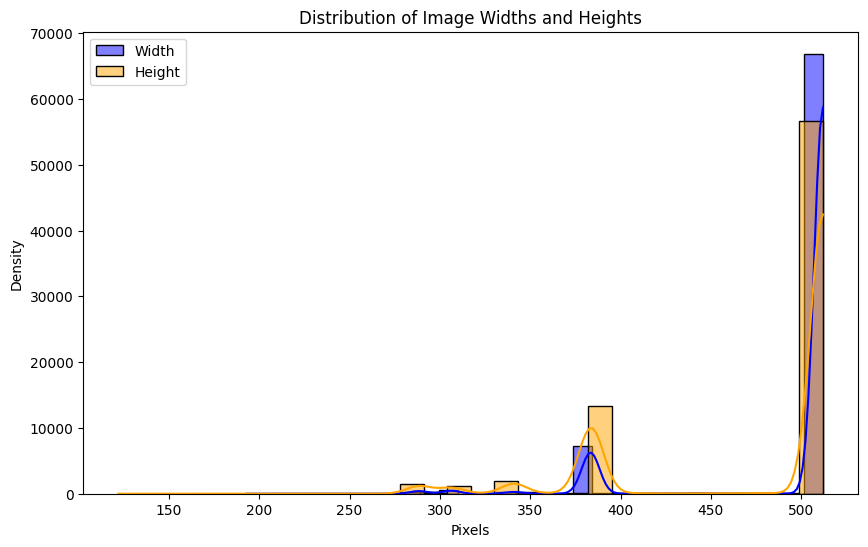

In [36]:
show_size_dist(df_train)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

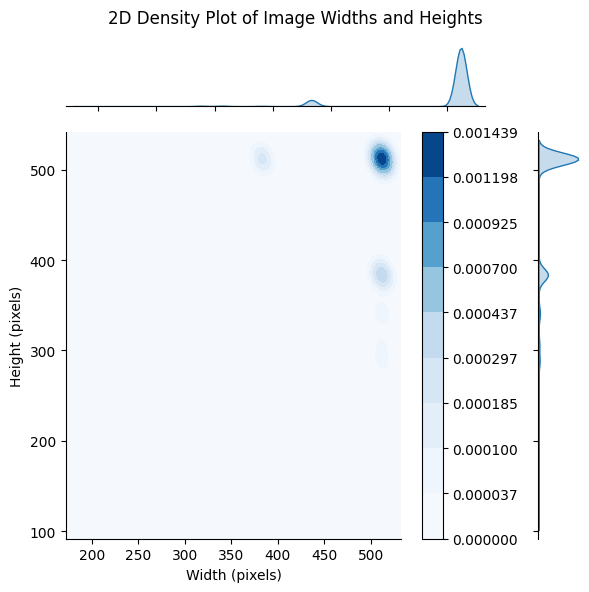

In [34]:
show_density(df_train)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


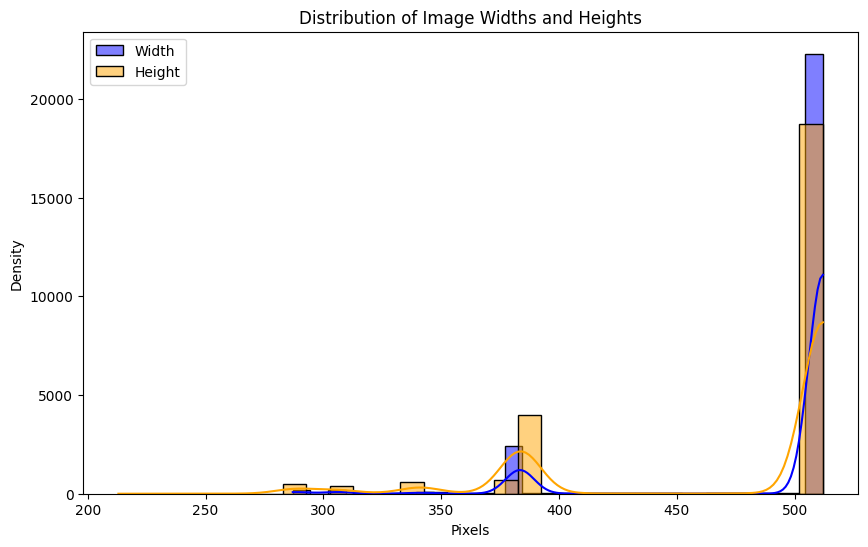

In [48]:
show_size_dist(df_test)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

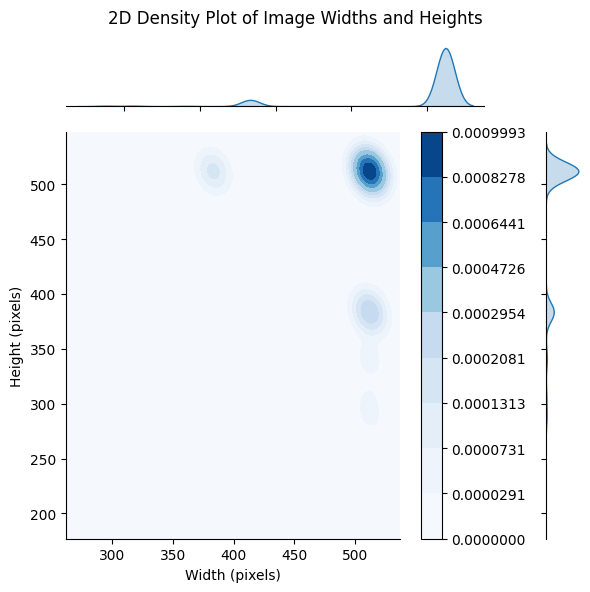

In [51]:
show_density(df_test)